# Problem Statement:
- The Australian real estate market is highly dynamic, with property prices influenced by a combination of geographic, structural, and market-specific factors. Accurately predicting property prices is crucial for stakeholders, including real estate agents, buyers, and investors, to make informed decisions. However, the complexity and variability in factors such as property type, number of rooms, land size, distance from the central business district (CBD), and selling method make price prediction a challenging task.

- Given the availability of a detailed dataset that includes attributes like property features, geographic details, and sales methods, a supervised machine learning model can be developed to predict house prices. Such a model would help in understanding the factors driving property prices and provide reliable price estimates, enabling more data-driven decision-making for stakeholders.

# Objectives:
- To develop a supervised machine learning model capable of accurately predicting house prices based on property-specific, geographic, and market attributes.
- To identify and quantify the most significant factors affecting house prices, such as property type, land size, distance from CBD, and number of rooms.
- To evaluate the model’s performance using appropriate regression metrics (e.g., R², RMSE) and ensure its predictions are robust and interpretable.

# Data 

### Feature description 

- **Rooms:** Number of rooms

- **Price:** Price in dollars

- **Method:** S - property sold; SP - property sold prior; PI - property passed in; PN - sold prior not disclosed; SN sold not disclosed; NB - no bid; VB - vendor bid; W - withdrawn prior to auction; SA - sold after auction; SS - sold after auction price not disclosed. N/A - price or highest bid not available.

- **Type:** br - bedroom(s); h - house,cottage,villa, semi,terrace; u - unit, duplex; t - townhouse; dev site - development site; o res - other residential.

- **SellerG:** Real Estate Agent

- **Date:** Date sold

- **Distance:** Distance from CBD

- **Regionname:** General Region (West, North West, North, North east …etc)

- **Propertycount:** Number of properties that exist in the suburb.

- **Bedroom2:** Scraped # of Bedrooms (from different source)

- **Bathroom:** Number of Bathrooms

- **Car:** Number of carspots

- **Landsize:** Land Size

- **BuildingArea:** Building Size

- **CouncilArea:** Governing council for the area

In [1]:
# Import dependencies 

import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 
import plotly.express as px

# For default view 
pd.set_option("display.max_columns", 75)

In [2]:
# Import data 
df = pd.read_csv("/home/western/Documents/Data/melb_data.csv")
df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,2.0,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,3.0,2.0,1.0,94.0,NaN,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


In [3]:
df.tail()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
13575,Wheelers Hill,12 Strada Cr,4,h,1245000.0,S,Barry,26/08/2017,16.7,3150.0,4.0,2.0,2.0,652.0,NaN,1981.0,NaN,-37.90562,145.16761,South-Eastern Metropolitan,7392.0
13576,Williamstown,77 Merrett Dr,3,h,1031000.0,SP,Williams,26/08/2017,6.8,3016.0,3.0,2.0,2.0,333.0,133.0,1995.0,NaN,-37.85927,144.87904,Western Metropolitan,6380.0
13577,Williamstown,83 Power St,3,h,1170000.0,S,Raine,26/08/2017,6.8,3016.0,3.0,2.0,4.0,436.0,NaN,1997.0,NaN,-37.85274,144.88738,Western Metropolitan,6380.0
13578,Williamstown,96 Verdon St,4,h,2500000.0,PI,Sweeney,26/08/2017,6.8,3016.0,4.0,1.0,5.0,866.0,157.0,1920.0,NaN,-37.85908,144.89299,Western Metropolitan,6380.0
13579,Yarraville,6 Agnes St,4,h,1285000.0,SP,Village,26/08/2017,6.3,3013.0,4.0,1.0,1.0,362.0,112.0,1920.0,NaN,-37.81188,144.88449,Western Metropolitan,6543.0


## Initial Data Exploration

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         13580 non-null  object 
 1   Address        13580 non-null  object 
 2   Rooms          13580 non-null  int64  
 3   Type           13580 non-null  object 
 4   Price          13580 non-null  float64
 5   Method         13580 non-null  object 
 6   SellerG        13580 non-null  object 
 7   Date           13580 non-null  object 
 8   Distance       13580 non-null  float64
 9   Postcode       13580 non-null  float64
 10  Bedroom2       13580 non-null  float64
 11  Bathroom       13580 non-null  float64
 12  Car            13518 non-null  float64
 13  Landsize       13580 non-null  float64
 14  BuildingArea   7130 non-null   float64
 15  YearBuilt      8205 non-null   float64
 16  CouncilArea    12211 non-null  object 
 17  Lattitude      13580 non-null  float64
 18  Longti

## Descriptive statistics 

In [5]:
# Numeric columns 
df.describe()

,Rooms,Price,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
count,13580.000000,1.358000e+04,13580.000000,13580.000000,13580.000000,13580.000000,13518.000000,13580.000000,7130.000000,8205.000000,13580.000000,13580.000000,13580.000000
mean,2.937997,1.075684e+06,10.137776,3105.301915,2.914728,1.534242,1.610075,558.416127,151.967650,1964.684217,-37.809203,144.995216,7454.417378
std,0.955748,6.393107e+05,5.868725,90.676964,0.965921,0.691712,0.962634,3990.669241,541.014538,37.273762,0.079260,0.103916,4378.581772
min,1.000000,8.500000e+04,0.000000,3000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1196.000000,-38.182550,144.431810,249.000000
25%,2.000000,6.500000e+05,6.100000,3044.000000,2.000000,1.000000,1.000000,177.000000,93.000000,1940.000000,-37.856822,144.929600,4380.000000
50%,3.000000,9.030000e+05,9.200000,3084.000000,3.000000,1.000000,2.000000,440.000000,126.000000,1970.000000,-37.802355,145.000100,6555.000000
75%,3.000000,1.330000e+06,13.000000,3148.000000,3.000000,2.000000,2.000000,651.000000,174.000000,1999.000000,-37.756400,145.058305,10331.000000
max,10.000000,9.000000e+06,48.100000,3977.000000,20.000000,8.000000,10.000000,433014.000000,44515.000000,2018.000000,-37.408530,145.526350,21650.000000


In [6]:
# Categorical columns 
df.describe(include='O')

,Suburb,Address,Type,Method,SellerG,Date,CouncilArea,Regionname
count,13580,13580,13580,13580,13580,13580,12211,13580
unique,314,13378,3,5,268,58,33,8
top,Reservoir,36 Aberfeldie St,h,S,Nelson,27/05/2017,Moreland,Southern Metropolitan
freq,359,3,9449,9022,1565,473,1163,4695


In [7]:
print(df.columns)

Index(['Suburb', 'Address', 'Rooms', 'Type', 'Price', 'Method', 'SellerG',
       'Date', 'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car',
       'Landsize', 'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude',
       'Longtitude', 'Regionname', 'Propertycount'],
      dtype='object')


In [8]:
# Rename columns 

df = df.rename(columns={'SellerG':'real_estate_agent', 'Bathroom':'no_of_bathroom', 'Bedroom2': 'no_of_bedrooms',
                        'BuildingArea':'building_size', 'YearBuilt': 'year_built', 'Type':'types',
                        'CouncilArea':'council_area', 'Regionname':'region_name',
                        'Propertycount':'property_count', 'Lattitude':'latitude', 'Longtitude':'longitude' })

#change column names to lowercase
df.columns = df.columns.str.lower()

df.columns

Index(['suburb', 'address', 'rooms', 'types', 'price', 'method',
       'real_estate_agent', 'date', 'distance', 'postcode', 'no_of_bedrooms',
       'no_of_bathroom', 'car', 'landsize', 'building_size', 'year_built',
       'council_area', 'latitude', 'longitude', 'region_name',
       'property_count'],
      dtype='object')

# Data Cleaning 

## Convert date column to datetiume format 


In [9]:
# Convert 'date' to datetime data type with inferred format
df['date'] = pd.to_datetime(df['date'], errors='coerce')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   suburb             13580 non-null  object        
 1   address            13580 non-null  object        
 2   rooms              13580 non-null  int64         
 3   types              13580 non-null  object        
 4   price              13580 non-null  float64       
 5   method             13580 non-null  object        
 6   real_estate_agent  13580 non-null  object        
 7   date               5138 non-null   datetime64[ns]
 8   distance           13580 non-null  float64       
 9   postcode           13580 non-null  float64       
 10  no_of_bedrooms     13580 non-null  float64       
 11  no_of_bathroom     13580 non-null  float64       
 12  car                13518 non-null  float64       
 13  landsize           13580 non-null  float64       
 14  buildi

In [10]:
df.head()

,suburb,address,rooms,types,price,method,real_estate_agent,date,distance,postcode,no_of_bedrooms,no_of_bathroom,car,landsize,building_size,year_built,council_area,latitude,longitude,region_name,property_count
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,2016-03-12,2.5,3067.0,2.0,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-04-02,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-04-03,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,2017-04-03,2.5,3067.0,3.0,2.0,1.0,94.0,NaN,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-04-06,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


## Duplicates 

In [11]:
df.duplicated(keep=False).sum()

16

In [12]:
df.columns

Index(['suburb', 'address', 'rooms', 'types', 'price', 'method',
       'real_estate_agent', 'date', 'distance', 'postcode', 'no_of_bedrooms',
       'no_of_bathroom', 'car', 'landsize', 'building_size', 'year_built',
       'council_area', 'latitude', 'longitude', 'region_name',
       'property_count'],
      dtype='object')

In [13]:
columns_to_check = ['suburb', 'address', 'rooms', 'types', 'price', 'method',
       'real_estate_agent', 'date', 'distance', 'postcode', 'no_of_bedrooms',
       'no_of_bathroom', 'car', 'landsize', 'building_size', 'year_built',
       'council_area', 'latitude', 'longitude', 'region_name',
       'property_count']

# View rows with duplicates
duplicates = df[df.duplicated(subset=columns_to_check, keep=False)]
duplicates.head(20)

,suburb,address,rooms,types,price,method,real_estate_agent,date,distance,postcode,no_of_bedrooms,no_of_bathroom,car,landsize,building_size,year_built,council_area,latitude,longitude,region_name,property_count
1306,Brunswick,8/2 Pottery Ct,3,t,641000.0,SP,RW,NaT,5.2,3056.0,3.0,2.0,1.0,0.0,112.0,1900.0,Moreland,-37.77030,144.95330,Northern Metropolitan,11918.0
1344,Brunswick,8/2 Pottery Ct,3,t,641000.0,SP,RW,NaT,5.2,3056.0,3.0,2.0,1.0,0.0,112.0,1900.0,Moreland,-37.77030,144.95330,Northern Metropolitan,11918.0
3701,Kew East,36 Belford Rd,4,h,1315000.0,SP,Nelson,NaT,7.5,3102.0,4.0,2.0,2.0,458.0,200.0,1930.0,Boroondara,-37.79810,145.04720,Southern Metropolitan,2671.0
3710,Kew East,36 Belford Rd,4,h,1315000.0,SP,Nelson,NaT,7.5,3102.0,4.0,2.0,2.0,458.0,200.0,1930.0,Boroondara,-37.79810,145.04720,Southern Metropolitan,2671.0
8642,Kensington,33 McCracken St,4,h,1817000.0,SP,Hodges,NaT,4.2,3031.0,4.0,2.0,1.0,309.0,NaN,NaN,Melbourne,-37.79100,144.92800,Northern Metropolitan,5263.0
8646,Kensington,33 McCracken St,4,h,1817000.0,SP,Hodges,NaT,4.2,3031.0,4.0,2.0,1.0,309.0,NaN,NaN,Melbourne,-37.79100,144.92800,Northern Metropolitan,5263.0
9673,Oak Park,79 New Rd,4,h,1071888.0,SP,Rendina,NaT,11.2,3046.0,4.0,2.0,4.0,553.0,190.0,2001.0,Moreland,-37.71328,144.90585,Northern Metropolitan,2651.0
9679,Parkdale,22 Keith St,4,h,1300000.0,SP,Buxton,NaT,21.5,3195.0,4.0,2.0,2.0,597.0,150.0,1970.0,Kingston,-37.99232,145.08469,South-Eastern Metropolitan,5087.0
9846,Coburg,34 Soudan St,2,h,996000.0,S,Nelson,NaT,6.7,3058.0,2.0,1.0,1.0,476.0,97.0,1930.0,Moreland,-37.73883,144.95321,Northern Metropolitan,11204.0
9994,Oak Park,79 New Rd,4,h,1071888.0,SP,Rendina,NaT,11.2,3046.0,4.0,2.0,4.0,553.0,190.0,2001.0,Moreland,-37.71328,144.90585,Northern Metropolitan,2651.0


In [14]:
df = df.drop_duplicates(keep='first')

In [15]:
df.duplicated(keep=False).sum()

0

## Missing values 

In [16]:
missing_values = df.isnull().sum()

In [17]:
# Total rows 
total_records = len(df)

# Missing values 
missing_values = df.isnull().sum()

# Percent missing values 
percent_missing_values = (missing_values/ total_records) * 100

# Use a DataFrame 
missing_values_df = pd.DataFrame({
    'missing_values': missing_values,
    'percentage (%)': percent_missing_values
})

print(f"Total records: {total_records}")
# Slice to only the missing values 
missing_values_df.iloc[:]





Total records: 13572


,missing_values,percentage (%)
suburb,0,0.000000
address,0,0.000000
rooms,0,0.000000
types,0,0.000000
price,0,0.000000
method,0,0.000000
real_estate_agent,0,0.000000
date,8434,62.142647
distance,0,0.000000
postcode,0,0.000000


In [18]:
df = df.drop(columns=['date'], errors='ignore')
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13572 entries, 0 to 13579
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   suburb             13572 non-null  object 
 1   address            13572 non-null  object 
 2   rooms              13572 non-null  int64  
 3   types              13572 non-null  object 
 4   price              13572 non-null  float64
 5   method             13572 non-null  object 
 6   real_estate_agent  13572 non-null  object 
 7   distance           13572 non-null  float64
 8   postcode           13572 non-null  float64
 9   no_of_bedrooms     13572 non-null  float64
 10  no_of_bathroom     13572 non-null  float64
 11  car                13510 non-null  float64
 12  landsize           13572 non-null  float64
 13  building_size      7125 non-null   float64
 14  year_built         8200 non-null   float64
 15  council_area       12203 non-null  object 
 16  latitude           13572 no

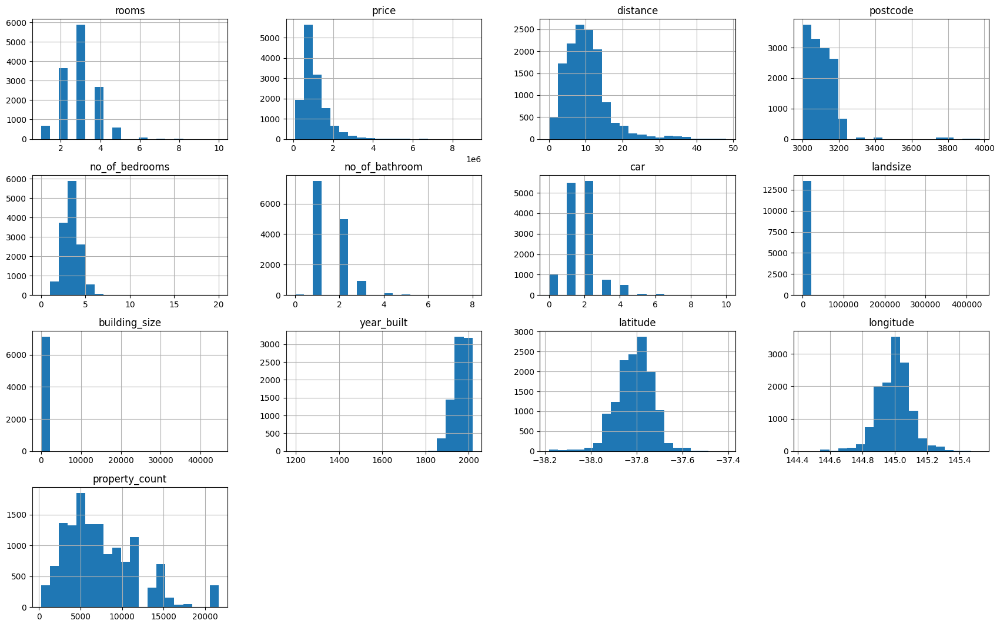

In [19]:
df.hist(bins=20, figsize=(21,13));

In [20]:
# Impute binary car column with modal value 
df['car'] = df['car'].fillna(df['car']).median()

# Impute council area with mode 
df['council_area']= df['council_area'].fillna(df['council_area'].mode()[0])

df.isnull().sum()

suburb                  0
address                 0
rooms                   0
types                   0
price                   0
method                  0
real_estate_agent       0
distance                0
postcode                0
no_of_bedrooms          0
no_of_bathroom          0
car                     0
landsize                0
building_size        6447
year_built           5372
council_area            0
latitude                0
longitude               0
region_name             0
property_count          0
dtype: int64

In [21]:
df['landsize'] = df['landsize'].replace(0, np.nan)
df['building_size'] = df['building_size'].replace(0, np.nan)

In [22]:
# Total rows 
total_records = len(df)

# Missing values 
missing_values = df.isnull().sum()

# Percent missing values 
percent_missing_values = (missing_values/ total_records) * 100

# Use a DataFrame 
missing_values_df = pd.DataFrame({
    'missing_values': missing_values,
    'percentage (%)': percent_missing_values
})

print(f"Total records: {total_records}")
# Slice to only the missing values 
missing_values_df.iloc[10:18, :]


Total records: 13572


,missing_values,percentage (%)
no_of_bathroom,0,0.000000
car,0,0.000000
landsize,1938,14.279399
building_size,6464,47.627468
year_built,5372,39.581491
council_area,0,0.000000
latitude,0,0.000000
longitude,0,0.000000


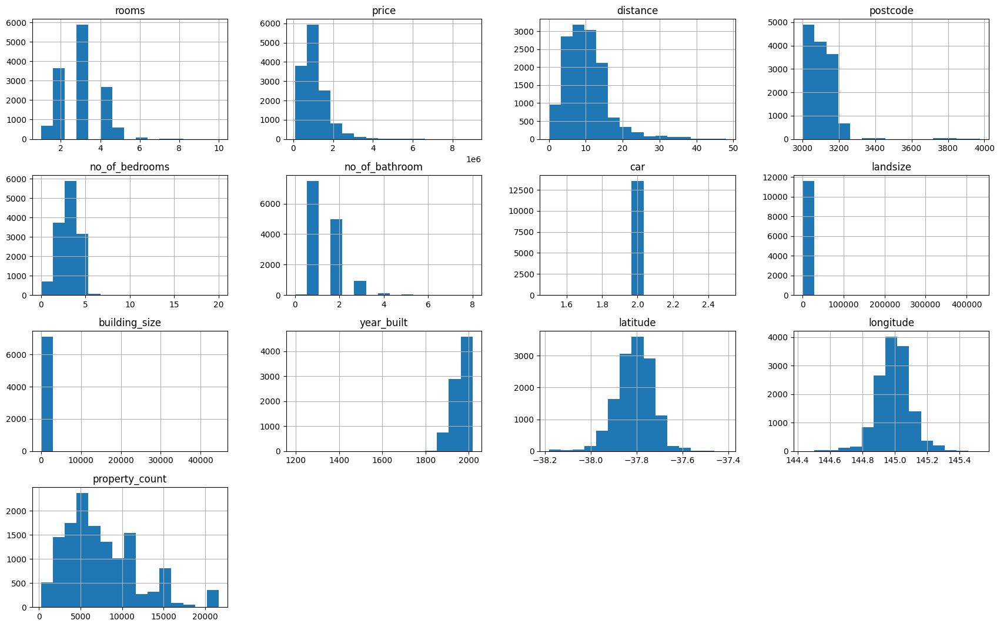

In [23]:
df.hist(bins=15, figsize=(21,13));

### Missing value imputation 

## Imputation 

### KNN imputation 

In [24]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler

# Select numeric columns from the DataFrame excluding the target column
target_column = 'price'
numeric_columns = df.select_dtypes(include='number').columns.drop(target_column)

# Initialize the StandardScaler
scaler = StandardScaler()

# Scale the numeric columns
df_scaled = df.copy()
df_scaled[numeric_columns] = scaler.fit_transform(df[numeric_columns])

# Initialize KNN Imputer
knn_imputer = KNNImputer(n_neighbors=5)

# Impute missing values using KNN Imputer
df_scaled[numeric_columns] = knn_imputer.fit_transform(df_scaled[numeric_columns])

# Inverse transform to get the original scale
df[numeric_columns] = scaler.inverse_transform(df_scaled[numeric_columns])

print("KNN Imputation completed successfully.")


KNN Imputation completed successfully.


In [25]:
df.isnull().sum()

suburb               0
address              0
rooms                0
types                0
price                0
method               0
real_estate_agent    0
distance             0
postcode             0
no_of_bedrooms       0
no_of_bathroom       0
car                  0
landsize             0
building_size        0
year_built           0
council_area         0
latitude             0
longitude            0
region_name          0
property_count       0
dtype: int64

### Non-Negative Constraint in the Imputation Model
- A "non-negative constraint" in the context of data imputation means that the imputed values generated by the model are always forced to be greater than or equal to zero, essentially preventing any negative values from being produced in the completed dataset; this is particularly useful when dealing with data where the underlying variable is inherently positive such as Prices, Counts, Distances, Probabilities, Physical quantities (e.g., weight, height, energy)

In [26]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np

# Select numeric columns from the DataFrame excluding the target column
target_column = 'price'
numeric_columns = df.select_dtypes(include='number').columns.drop(target_column)

# Standardize the data
scaler = StandardScaler()
df_scaled = df.copy()
df_scaled[numeric_columns] = scaler.fit_transform(df[numeric_columns])

# Use Lasso with adjusted parameters for non-negative constraint
lasso = Lasso(alpha=1.0, positive=True, max_iter=10000)

# Initialize Iterative Imputer with Lasso as the estimator
iterative_imputer = IterativeImputer(estimator=lasso, random_state=42, max_iter=10000, tol=1e-4)

# Impute missing values
df_scaled[numeric_columns] = iterative_imputer.fit_transform(df_scaled[numeric_columns])

# Inverse transform to get the original scale
df[numeric_columns] = scaler.inverse_transform(df_scaled[numeric_columns])

print("Imputation with Lasso completed successfully.")


Imputation with Lasso completed successfully.


/home/western/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(


### Interative imputation 

In [27]:
# from sklearn.experimental import enable_iterative_imputer  # enable the IterativeImputer
# from sklearn.impute import IterativeImputer
# from sklearn.preprocessing import StandardScaler


# # Select numeric columns from the DataFrame excluding the target column
# target_column = 'price'
# numeric_columns = df.select_dtypes(include='number').columns.drop(target_column)

# # Check for missing values in numeric columns
# if df[numeric_columns].isnull().any().any():
#     print("Missing values detected in numeric columns.")

# # Initialize the StandardScaler
# scaler = StandardScaler()

# # Scale the numeric columns (consider handling missing values first)
# df_scaled = df.copy()
# df_scaled[numeric_columns] = scaler.fit_transform(df[numeric_columns])

# # Initialize Iterative Imputer with additional parameters
# iterative_imputer = IterativeImputer(random_state=42, max_iter=20, tol=1e-4, verbose=0)
# #iterative_imputer = IterativeImputer(estimator=RandomForestRegressor(), random_state=42, max_iter=20, tol=1e-4, verbose=2)

# # Impute missing values using Iterative Imputer (MICE)
# df_scaled[numeric_columns] = iterative_imputer.fit_transform(df_scaled[numeric_columns])

# # Inverse transform to get the original scale
# df[numeric_columns] = scaler.inverse_transform(df_scaled[numeric_columns])

# print("Imputation completed successfully.")


### Random sampling 

In [28]:
# # # Function for random sampling, include random_state for reproducibility  

# def random_sampling_imputation(df, column_name, random_state=None):
#     if random_state is not None:
#         np.random.seed(random_state)
#     # Get the column
#     column = df[column_name]
#     # Get indices of missing values
#     missing_indices = column[column.isnull()].index
#     # Perform random sampling
#     sampled_values = np.random.choice(column.dropna(), size=len(missing_indices))
#     # Assign sampled values directly using .loc
#     df.loc[missing_indices, column_name] = sampled_values
#     return df

# df = random_sampling_imputation(df, 'building_size', random_state=42)
# df = random_sampling_imputation(df, 'year_built', random_state=42)
# df = random_sampling_imputation(df, 'landsize', random_state=42)


- For building_size: 
- Random Sampling from Existing Values is better. It preserves natural variability and ensures imputed values reflect realistic distributions.

In [29]:
df.isnull().sum()

suburb               0
address              0
rooms                0
types                0
price                0
method               0
real_estate_agent    0
distance             0
postcode             0
no_of_bedrooms       0
no_of_bathroom       0
car                  0
landsize             0
building_size        0
year_built           0
council_area         0
latitude             0
longitude            0
region_name          0
property_count       0
dtype: int64

In [30]:
df.describe()

,rooms,price,distance,postcode,no_of_bedrooms,no_of_bathroom,car,landsize,building_size,year_built,latitude,longitude,property_count
count,13572.000000,1.357200e+04,13572.000000,13572.000000,13572.000000,13572.000000,13572.0,13572.000000,13572.000000,13572.000000,13572.000000,13572.000000,13572.000000
mean,2.937813,1.075684e+06,10.138859,3105.320881,2.914530,1.534188,2.0,732.006042,147.108631,1963.690274,-37.809214,144.995230,7454.901488
std,0.955788,6.394321e+05,5.868670,90.692207,0.965962,0.691812,0.0,4287.520624,402.975038,32.817694,0.079256,0.103935,4379.108325
min,1.000000,8.500000e+04,0.000000,3000.000000,0.000000,0.000000,2.0,1.000000,1.000000,1196.000000,-38.182550,144.431810,249.000000
25%,2.000000,6.500000e+05,6.100000,3044.000000,2.000000,1.000000,2.0,282.000000,93.835000,1947.400000,-37.856840,144.929600,4380.000000
50%,3.000000,9.027500e+05,9.200000,3084.000000,3.000000,1.000000,2.0,539.000000,125.400000,1966.600000,-37.802385,145.000100,6555.000000
75%,3.000000,1.330000e+06,13.000000,3148.000000,3.000000,2.000000,2.0,697.000000,170.450000,1987.000000,-37.756415,145.058328,10331.000000
max,10.000000,9.000000e+06,48.100000,3977.000000,20.000000,8.000000,2.0,433014.000000,44515.000000,2018.000000,-37.408530,145.526350,21650.000000


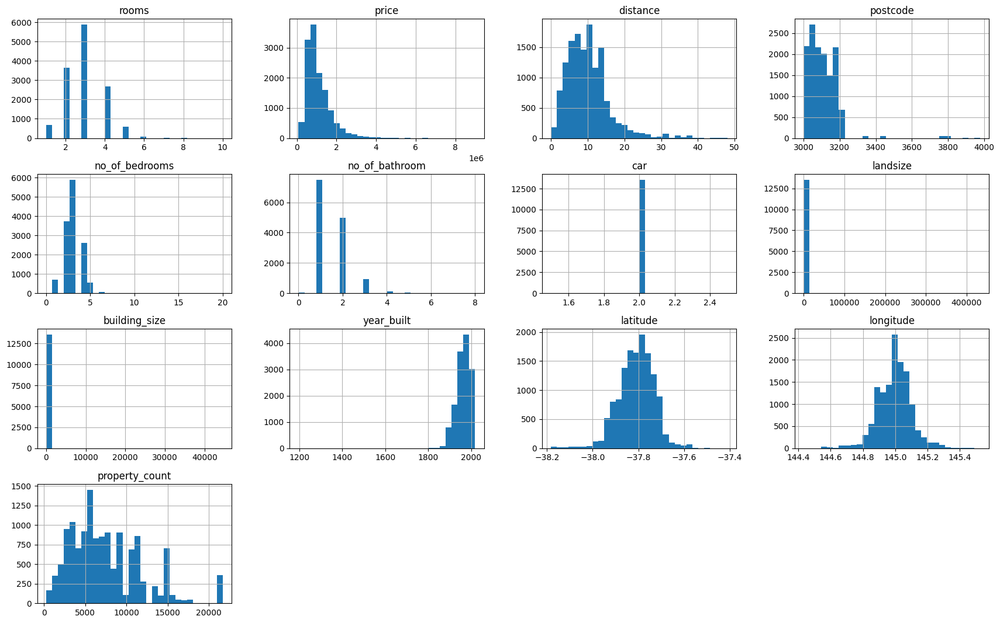

In [31]:
df.hist(bins=30, figsize=(21,13));


## Univariate Analysis 

### Data Distribution 

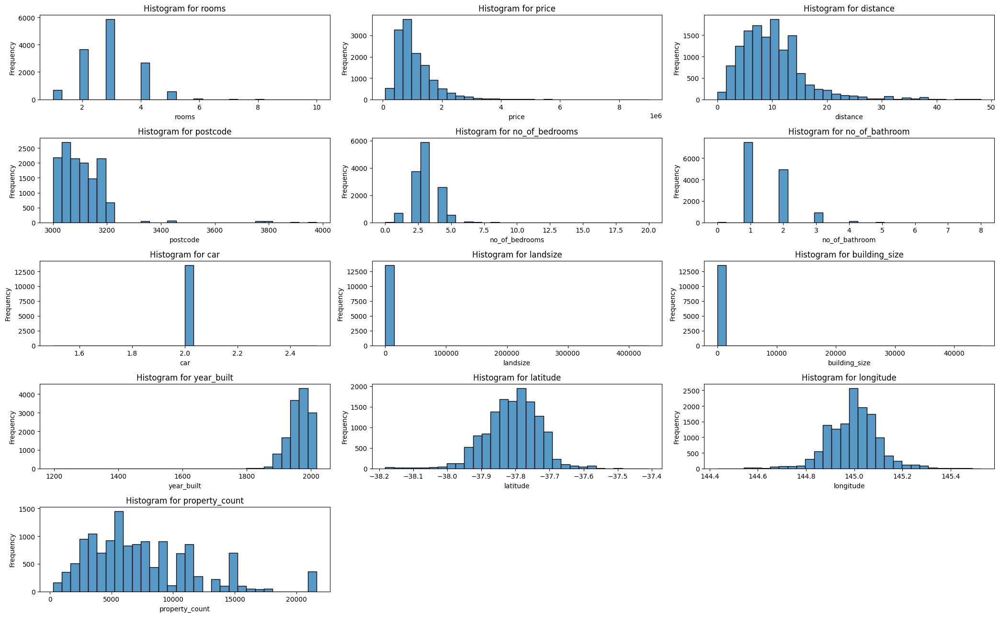

In [32]:
# Only select numeric columns 
numeric_columns = df.select_dtypes(include=['number']).columns[:]


# Define grd layout 
rows, cols = 5,3
fig, axes = plt.subplots(rows, cols, figsize=(21,13))

# Flatten the arrays 
axes = axes.flatten()

# Plot histograms for numeric columns 
for i, column in enumerate(numeric_columns):
    sns.histplot(df[column], bins=30, ax=axes[i])
    axes[i].set_title(f'Histogram for {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')
    
    
# Hide empty subplots 
for j in range (i + 1, rows * cols):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

## Observations 

- Latitude and longitude show normal distribution 

In [33]:
# Select categorical columns (object type)
cat_columns = df.select_dtypes(include=['O'])

print(cat_columns.columns)

Index(['suburb', 'address', 'types', 'method', 'real_estate_agent',
       'council_area', 'region_name'],
      dtype='object')


### For categorical columns 

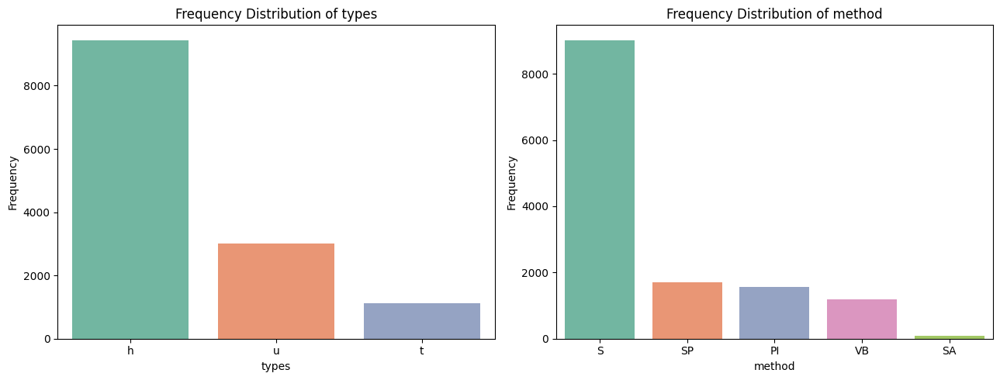

In [34]:
# Specify the categorical columns you want to plot
cat_columns = ['types', 'method']

# Define grid layout for the subplots
rows, cols = 1, 2  # Adjusted grid layout since you have 2 columns to plot
fig, axes = plt.subplots(rows, cols, figsize=(13, 5))

# Flatten the axes array to make indexing easier
axes = axes.flatten()

# Loop through each column and plot using Seaborn's countplot
for i, column in enumerate(cat_columns):
    # Use Seaborn's countplot for categorical data
    sns.countplot(data=df, x=column, ax=axes[i], palette='Set2', hue=column)
    
    # Set plot title and labels
    axes[i].set_title(f'Frequency Distribution of {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')
    axes[i].tick_params(axis='x', rotation=0)  # Rotate x labels for readability

plt.tight_layout()
plt.show()



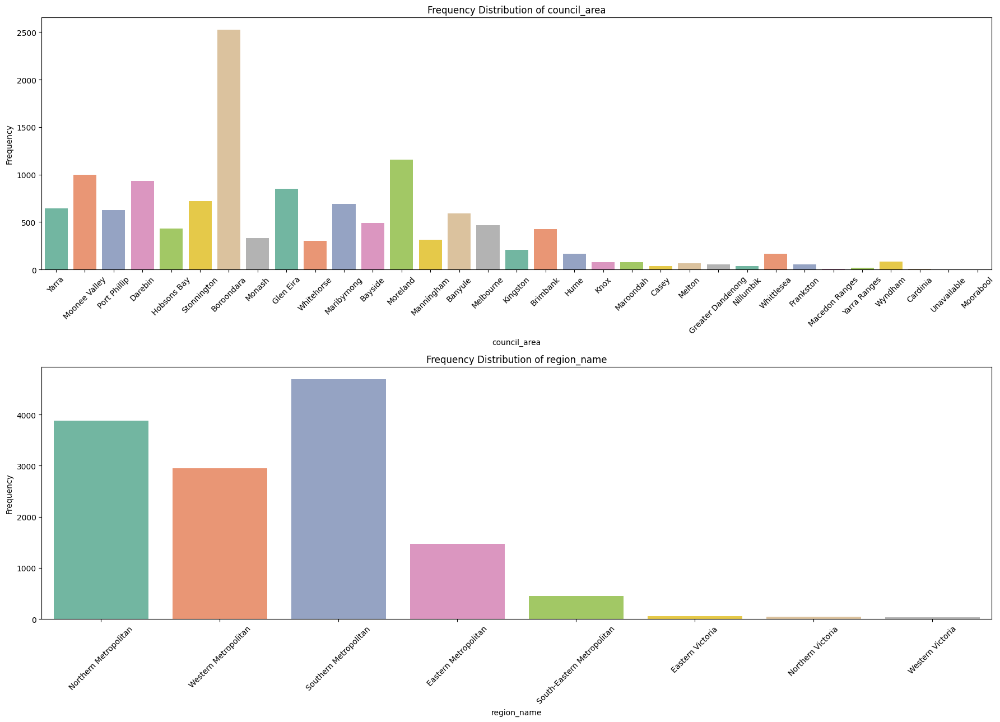

In [35]:
# Specify the categorical columns you want to plot
cat_columns = ['council_area', 'region_name']

# Define grid layout for the subplots
rows, cols = 2, 1  # Adjusted grid layout since you have 2 columns to plot
fig, axes = plt.subplots(rows, cols, figsize=(18, 13))

# Flatten the axes array to make indexing easier
axes = axes.flatten()

# Loop through each column and plot using Seaborn's countplot
for i, column in enumerate(cat_columns):
    # Use Seaborn's countplot for categorical data
    sns.countplot(data=df, x=column, ax=axes[i], palette='Set2', hue=column)
    
    # Set plot title and labels
    axes[i].set_title(f'Frequency Distribution of {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')
    axes[i].tick_params(axis='x', rotation=45)  # Rotate x labels for readability

plt.tight_layout()
plt.show()


### Outliers 
- Box plot is ideal for non-normal distributions

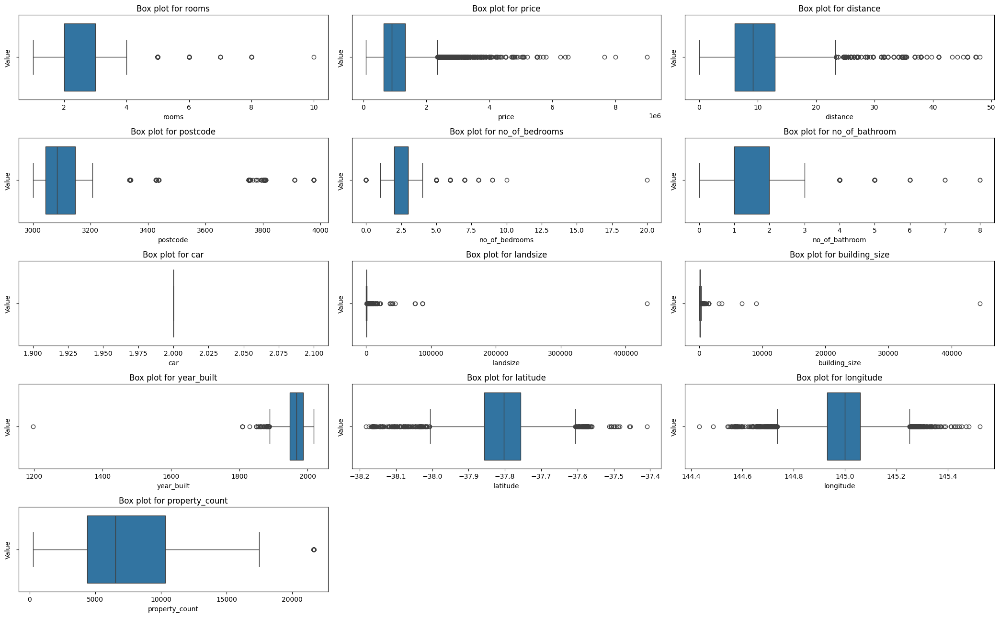

In [36]:
# Grid layout
rows, cols = 5, 3
fig, axes = plt.subplots(rows, cols, figsize=(21, 13))


# Flatten 
axes = axes.flatten()

for i, column in enumerate(numeric_columns):
    sns.boxplot(x=df[column], ax = axes[i])
    axes[i].set_title(f"Box plot for {column}")
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Value')
    
# Hide empty subplots 
for j in range(i + 1, rows * cols):
    axes[j].axis('off')
    
plt.tight_layout()
plt.show()


### Drop outliers 

In [37]:
# Create a copy of the data
data_copy = df.copy()
# Select only numeric columns
numeric_data = data_copy.select_dtypes(include=['number'])

# Calculate q1, q3, and IQR for numeric data only
q1 = numeric_data.quantile(0.20)  # .25
q3 = numeric_data.quantile(0.80)  # .75
IQR = q3 - q1

# Lower and upper bounds for identifying outliers
lower_bound = q1 - (1.5 * IQR)
upper_bound = q3 + (1.5 * IQR)

# Identify outliers in numeric columns
outliers_ = set()
for col in numeric_data.columns:
    outliers = numeric_data[(numeric_data[col] < lower_bound[col]) | (numeric_data[col] > upper_bound[col])]
    outliers_.update(outliers.index)

# Count number of rows before removing outliers
num_rows_before = len(data_copy)

# Remove rows with outliers from the original DataFrame (important!)
data_copy = data_copy.drop(index=outliers_)

# Num of rows after removing outliers
num_rows_after = len(data_copy)

# Number of rows removed
rows_removed = num_rows_before - num_rows_after

# Print the results
print(f"Number of rows before removing outliers: {num_rows_before}")
print(f"Number of rows after removing outliers: {num_rows_after}")
print(f"Number of rows removed: {rows_removed}")

df = data_copy.copy()


Number of rows before removing outliers: 13572
Number of rows after removing outliers: 11941
Number of rows removed: 1631


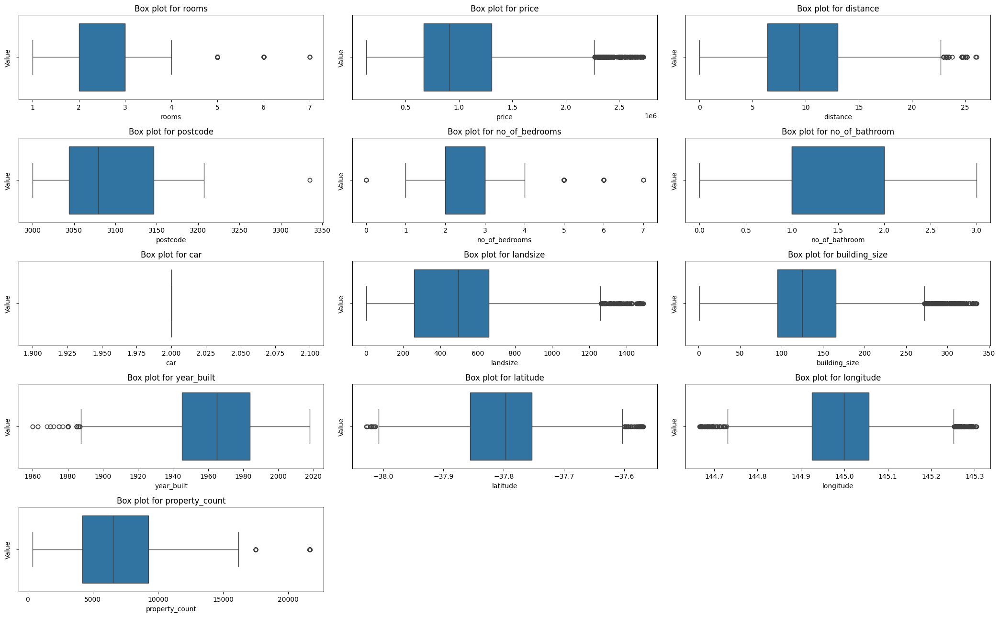

In [38]:
# Grid layout
rows, cols = 5, 3
fig, axes = plt.subplots(rows, cols, figsize=(21, 13))


# Flatten 
axes = axes.flatten()

for i, column in enumerate(numeric_columns):
    sns.boxplot(x=df[column], ax = axes[i])
    axes[i].set_title(f"Box plot for {column}")
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Value')
    
# Hide empty subplots 
for j in range(i + 1, rows * cols):
    axes[j].axis('off')
    
plt.tight_layout()
plt.show()

In [39]:
print(df.columns)

Index(['suburb', 'address', 'rooms', 'types', 'price', 'method',
       'real_estate_agent', 'distance', 'postcode', 'no_of_bedrooms',
       'no_of_bathroom', 'car', 'landsize', 'building_size', 'year_built',
       'council_area', 'latitude', 'longitude', 'region_name',
       'property_count'],
      dtype='object')


In [40]:
num_columns = df.select_dtypes(include=['number'])
print(num_columns.columns)

Index(['rooms', 'price', 'distance', 'postcode', 'no_of_bedrooms',
       'no_of_bathroom', 'car', 'landsize', 'building_size', 'year_built',
       'latitude', 'longitude', 'property_count'],
      dtype='object')


### Suburb

In [41]:
df['suburb'].value_counts()

suburb
Reservoir           351
Bentleigh East      243
Preston             232
Brunswick           218
Essendon            212
                   ... 
Croydon South         1
Attwood               1
North Warrandyte      1
Williams Landing      1
Plumpton              1
Name: count, Length: 258, dtype: int64

In [42]:
df['suburb'].nunique()

258

### Type 

In [43]:
house_type = df['types'].value_counts().reset_index(name='house_type_count')
house_type

,types,house_type_count
0,h,8445
1,u,2435
2,t,1061


In [44]:
fig = px.bar(house_type, x='types',
            y='house_type_count', color= 'types',
            title = 'Different House Types')

fig.update_layout(width=950, height=400)

### Method

In [45]:
sales_method = df['method'].value_counts().reset_index(name='method_count')
sales_method

,method,method_count
0,S,8051
1,SP,1472
2,PI,1355
3,VB,983
4,SA,80


In [46]:
fig = px.bar(sales_method, x='method',
            y='method_count', color= 'method',
            title = 'Different ways of selling a house')

fig.update_layout(width=950, height=400)

### Council Area

In [47]:
council_area = df['council_area'].value_counts().reset_index(name='count')
council_area

,council_area,count
0,Boroondara,2086
1,Moreland,1136
2,Moonee Valley,952
3,Darebin,908
4,Glen Eira,811
5,Maribyrnong,648
6,Banyule,569
7,Stonnington,563
8,Yarra,539
9,Port Phillip,502


In [48]:
fig = px.bar(council_area, x='council_area',
            y='count', color= 'council_area',
            title = 'Different Council Areas')

fig.update_layout(width=950, height=600)

## Multivariate analysis 

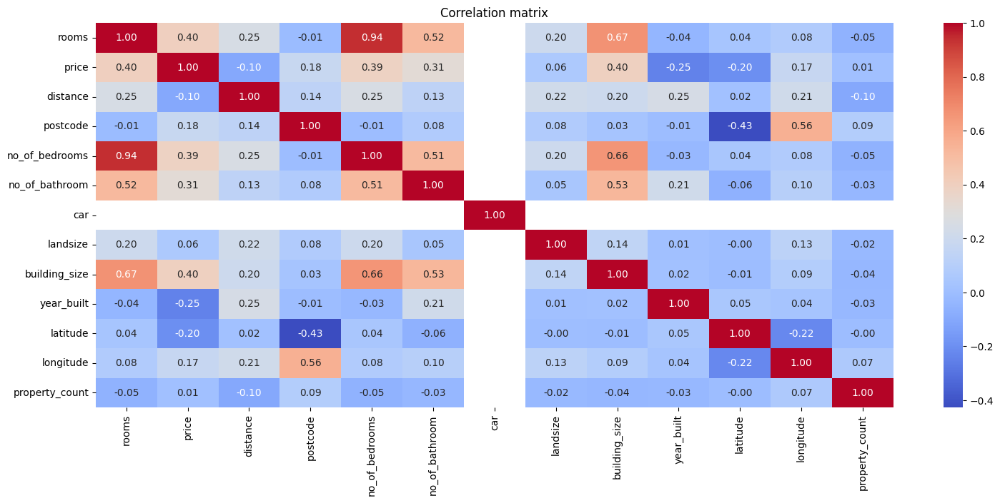

In [49]:
numeric_columns = df.select_dtypes(include=['number']).columns

# Correlation matrix 
corr_matrix = df[numeric_columns].corr(method='kendall')

# Plot 
plt.figure(figsize=(18, 7))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation matrix')
plt.show()

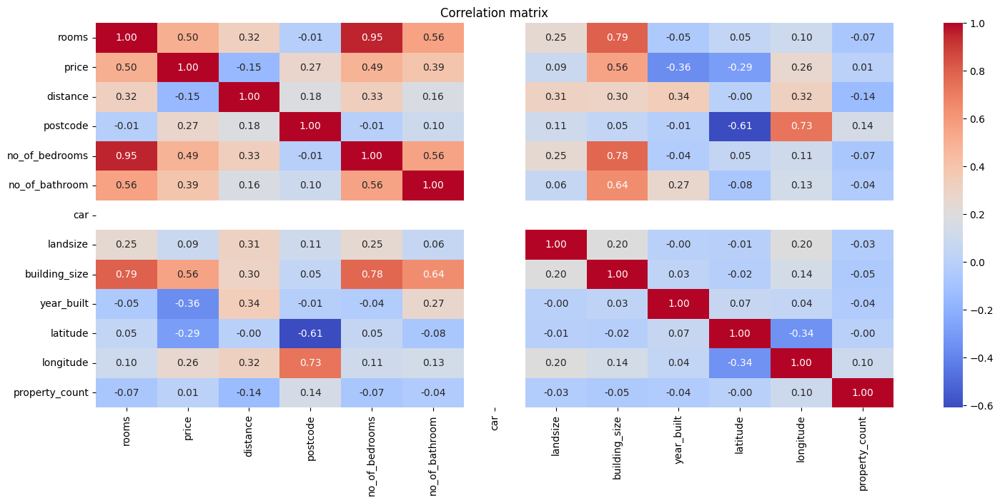

In [50]:
numeric_columns = df.select_dtypes(include=['number']).columns

# Correlation matrix 
corr_matrix = df[numeric_columns].corr(method='spearman')

# Plot 
plt.figure(figsize=(18, 7))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation matrix')
plt.show()

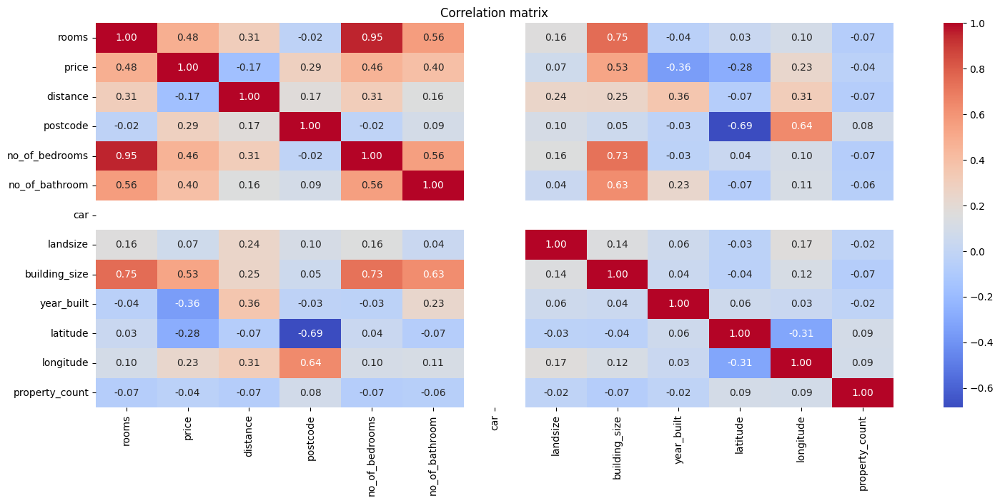

In [51]:
numeric_columns = df.select_dtypes(include=['number']).columns

# Correlation matrix 
corr_matrix = df[numeric_columns].corr(method='pearson')

# Plot 
plt.figure(figsize=(18, 7))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation matrix')
plt.show()

### Combine number of bathroom and number of bedrooms to rooms 

In [52]:
df['total_rooms'] = df['rooms'] + df["no_of_bathroom"] + df['no_of_bedrooms']

# Correct column names for features
features = ['total_rooms']

# Scatter plots for Price vs Features grouped by Property Type
for feature in features:
    fig = px.scatter(
        df,
        x=feature,
        y='price',
        color='types',
        title=f'Price vs {feature.replace("_", " ").capitalize()} by Property Type',
        labels={feature: feature.replace("_", " ").capitalize(), 'price': 'Price'},
        opacity=0.7,
        template='plotly_white'
    )
    fig.show()

## Method, price and type

In [53]:
# Correct column names for features
features = ['method']

# Scatter plots for Price vs Features grouped by Property Type
for feature in features:
    fig = px.scatter(
        df,
        x=feature,
        y='price',
        color='types',
        title=f'Price vs {feature.replace("_", " ").capitalize()} by Property Type',
        labels={feature: feature.replace("_", " ").capitalize(), 'price': 'Price'},
        opacity=0.7,
        template='plotly_white'
    )
    fig.show()

In [54]:

# 1. Calculate Agent Performance Metrics
agent_performance = df.groupby('real_estate_agent').agg(
    average_price=('price', 'mean'),
    total_sales=('price', 'count')
).reset_index()

# 2. Add a Rank Column for Average Price and Total Sales
agent_performance['price_rank'] = agent_performance['average_price'].rank(ascending=False)
agent_performance['sales_rank'] = agent_performance['total_sales'].rank(ascending=False)

# Sort by Price Rank
agent_performance = agent_performance.sort_values(by='price_rank')

# Display Top Agents
top_agents = agent_performance.head(10)

top_agents

,real_estate_agent,average_price,total_sales,price_rank,sales_rank
112,Lucas,2450000.0,1,1.0,206.0
143,North,2200000.0,1,2.0,206.0
21,Blue,2180000.0,1,3.0,206.0
206,Upper,2100000.0,1,4.0,206.0
63,Elite,2042000.0,1,5.0,206.0
219,White,2035000.0,1,6.0,206.0
105,LLC,2020000.0,1,7.0,206.0
161,Private/Tiernan's,1880000.0,1,8.0,206.0
213,WHITEFOX,1820000.0,1,9.0,206.0
176,Real,1812500.0,2,10.0,157.5


In [55]:
# Plot Average Price by Agent (Top 10 by Price)
fig = px.bar(
    top_agents,
    x='real_estate_agent',
    y='average_price',
    title='Top 10 Agents by Average Sale Price',
    labels={'real_estate_agent': 'Agent', 'average_price': 'Average Price'},
    color='average_price',
    color_continuous_scale='Viridis'
)
fig.update_layout(template='plotly_white', xaxis_tickangle=45)
fig.show()



In [56]:
# 4. Plot Total Sales by Agent (Top 10 by Frequency)
top_sales_agents = agent_performance.sort_values(by='sales_rank').head(10)

fig = px.bar(
    top_sales_agents,
    x='real_estate_agent',
    y='total_sales',
    title='Top 10 Agents by Total Sales',
    labels={'real_estate_agent': 'Agent', 'total_sales': 'Total Sales'},
    color='total_sales',
    color_continuous_scale='Plasma'
)
fig.update_layout(template='plotly_white', xaxis_tickangle=45)
fig.show()



In [57]:
# 5. Combined Metrics (Scatter Plot: Average Price vs Total Sales)
fig = px.scatter(
    agent_performance,
    x='total_sales',
    y='average_price',
    size='total_sales',
    color='average_price',
    title='Agent Performance: Average Price vs Total Sales',
    labels={'total_sales': 'Total Sales', 'average_price': 'Average Price'},
    hover_data=['real_estate_agent', 'price_rank', 'sales_rank'],
    template='plotly_white',
    color_continuous_scale='Magma'
)
fig.show()

In [59]:
df.columns

Index(['suburb', 'address', 'rooms', 'types', 'price', 'method',
       'real_estate_agent', 'distance', 'postcode', 'no_of_bedrooms',
       'no_of_bathroom', 'car', 'landsize', 'building_size', 'year_built',
       'council_area', 'latitude', 'longitude', 'region_name',
       'property_count', 'total_rooms'],
      dtype='object')

## Monthly Mean house prices 

In [60]:
# # Correctly parse the date column (assuming MM/DD/YYYY format)
# df['date'] = pd.to_datetime(df['date'], format='%d/%m/%Y')


# # Extract year and month for additional analysis
# df['year'] = df['date'].dt.year
# df['month'] = df['date'].dt.month


# # Cyclical features for month
# df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
# df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)

# df.head()




In [ ]:
# # Ensure 'Date' is in datetime format
# df['date'] = pd.to_datetime(df['date'])

# # Aggregate by year and month to calculate the mean price
# monthly_trend = df.groupby(df['date'].dt.to_period('M'))['price'].mean()

# # Reset index to use for plotting
# monthly_trend = monthly_trend.reset_index()
# monthly_trend['date'] = monthly_trend['date'].dt.to_timestamp()

# # Plot the monthly price trend
# plt.figure(figsize=(12, 6))
# plt.plot(monthly_trend['date'], monthly_trend['price'], marker='o', color='coral', label='Mean Price', )
# plt.title('Average House Prices Over Time')
# plt.xlabel('Time (Year-Month)')
# plt.ylabel('Average Price')
# # plt.grid(True)
# plt.tight_layout()
# plt.legend()
# plt.show()


In [ ]:
# import plotly.express as px

# # Ensure 'date' is in datetime format
# df['date'] = pd.to_datetime(df['date'])

# # Aggregate by year and month to calculate the mean price
# monthly_trend = df.groupby(df['date'].dt.to_period('M'))['price'].mean()

# # Reset index to use for plotting
# monthly_trend = monthly_trend.reset_index()
# monthly_trend['date'] = monthly_trend['date'].dt.to_timestamp()

# # Plot using Plotly Express
# fig = px.line(
#     monthly_trend,
#     x='date',
#     y='price',
#     title='Average House Prices Over Time',
#     labels={'date': 'Time (Year-Month)', 'price': 'Average Price'},
#     markers=True
# )

# # Customize layout
# fig.update_traces(line_color='coral')
# fig.update_layout(
#     xaxis_title='Time (Year-Month)',
#     yaxis_title='Average Price',
#     template='plotly_white'
# )

# # Show the plot
# fig.show()


In [61]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from lightgbm import LGBMRegressor
from sklearn.svm import SVR
from catboost import CatBoostRegressor
from xgboost import XGBRegressor

# Preprocessing 

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

# Evaluation 
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# time 
import time

In [62]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11941 entries, 0 to 13579
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   suburb             11941 non-null  object 
 1   address            11941 non-null  object 
 2   rooms              11941 non-null  float64
 3   types              11941 non-null  object 
 4   price              11941 non-null  float64
 5   method             11941 non-null  object 
 6   real_estate_agent  11941 non-null  object 
 7   distance           11941 non-null  float64
 8   postcode           11941 non-null  float64
 9   no_of_bedrooms     11941 non-null  float64
 10  no_of_bathroom     11941 non-null  float64
 11  car                11941 non-null  float64
 12  landsize           11941 non-null  float64
 13  building_size      11941 non-null  float64
 14  year_built         11941 non-null  float64
 15  council_area       11941 non-null  object 
 16  latitude           11941 no

In [63]:
df = df.drop(columns=["address",'suburb','real_estate_agent', 'date', 
                      'postcode', 'car'], axis=1, errors='ignore')

cat_columns = df.select_dtypes(include=['object'])
cat_columns.columns

Index(['types', 'method', 'council_area', 'region_name'], dtype='object')

In [64]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11941 entries, 0 to 13579
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   rooms           11941 non-null  float64
 1   types           11941 non-null  object 
 2   price           11941 non-null  float64
 3   method          11941 non-null  object 
 4   distance        11941 non-null  float64
 5   no_of_bedrooms  11941 non-null  float64
 6   no_of_bathroom  11941 non-null  float64
 7   landsize        11941 non-null  float64
 8   building_size   11941 non-null  float64
 9   year_built      11941 non-null  float64
 10  council_area    11941 non-null  object 
 11  latitude        11941 non-null  float64
 12  longitude       11941 non-null  float64
 13  region_name     11941 non-null  object 
 14  property_count  11941 non-null  float64
 15  total_rooms     11941 non-null  float64
dtypes: float64(12), object(4)
memory usage: 1.5+ MB


### One hot encoding 

In [65]:
from sklearn.preprocessing import OneHotEncoder

# Create a list of columns to encode
categorical_columns = ['types', 'method', 'council_area', 'region_name']

# Create a copy of the DataFrame with the selected columns
encoded_df = df.copy()

# Create an instance of OneHotEncoder
# sparse=False to produce a dense array and drop='first' to drop the first category of each variable
encoder = OneHotEncoder(sparse_output=False, drop='first')

# Iterate through each categorical column

for column in categorical_columns:
    # Fit and transform the selected column
    one_hot_encoded = encoder.fit_transform(encoded_df[[column]])

    # Create a DataFrame with one-hot encoded columns
    one_hot_df = pd.DataFrame(one_hot_encoded, columns=encoder.get_feature_names_out([column]))

    # Concatenate the one-hot encoded DataFrame with the original DataFrame
    encoded_df = pd.concat([encoded_df, one_hot_df], axis=1)

    # Drop the original categorical column
    encoded_df = encoded_df.drop([column], axis=1)

# Display the resulting DataFrame
df= encoded_df.copy()

df.head()

,rooms,price,distance,no_of_bedrooms,no_of_bathroom,landsize,building_size,year_built,latitude,longitude,property_count,total_rooms,types_t,types_u,method_S,method_SA,method_SP,method_VB,method_nan,council_area_Bayside,council_area_Boroondara,council_area_Brimbank,council_area_Darebin,council_area_Glen Eira,council_area_Greater Dandenong,council_area_Hobsons Bay,council_area_Hume,council_area_Kingston,council_area_Knox,council_area_Manningham,council_area_Maribyrnong,council_area_Maroondah,council_area_Melbourne,council_area_Melton,council_area_Monash,council_area_Moonee Valley,council_area_Moreland,council_area_Nillumbik,council_area_Port Phillip,council_area_Stonnington,council_area_Unavailable,council_area_Whitehorse,council_area_Whittlesea,council_area_Wyndham,council_area_Yarra,council_area_nan,region_name_Eastern Victoria,region_name_Northern Metropolitan,region_name_Northern Victoria,region_name_South-Eastern Metropolitan,region_name_Southern Metropolitan,region_name_Western Metropolitan,region_name_nan
0,2.0,1480000.0,2.5,2.0,1.0,202.0,80.8,1939.0,-37.7996,144.9984,4019.0,5.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,2.0,1035000.0,2.5,2.0,1.0,156.0,79.0,1900.0,-37.8079,144.9934,4019.0,5.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,3.0,1465000.0,2.5,3.0,2.0,134.0,150.0,1900.0,-37.8093,144.9944,4019.0,8.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,3.0,850000.0,2.5,3.0,2.0,94.0,97.2,1955.0,-37.7969,144.9969,4019.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,4.0,1600000.0,2.5,3.0,1.0,120.0,142.0,2014.0,-37.8072,144.9941,4019.0,8.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [66]:
df['method_nan'].unique()

array([ 0.,  1., nan])

### Feature selection 

In [67]:
# from sklearn.model_selection import train_test_split
# from sklearn.preprocessing import StandardScaler

# # Drop null values
# df = df.dropna()

# # Defining the dependent variables/features
# X = df.drop(columns=['price'])

# # Target variable
# y = df['price']

# # Split into training and temporary sets (70% train, 30% temp)
# X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)

# # Split the temporary set into validation and test sets (50% each)
# X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=42)

# # Columns to scale
# columns_to_scale = ['rooms', 'distance', 'no_of_bedrooms', 'no_of_bathroom', 'car', 'landsize',
#                     'latitude', 'longitude', 
#                    'property_count', 'total_rooms']

# # Initialize the standard scaler
# scaler = StandardScaler()

# # Fit and transform the specified columns in the training data
# X_train_scaled = X_train.copy()
# X_train_scaled[columns_to_scale] = scaler.fit_transform(X_train[columns_to_scale])

# # Transform the specified columns in the validation and test data
# X_val_scaled = X_val.copy()
# X_val_scaled[columns_to_scale] = scaler.transform(X_val[columns_to_scale])

# X_test_scaled = X_test.copy()
# X_test_scaled[columns_to_scale] = scaler.transform(X_test[columns_to_scale])

In [68]:

# Define the features and target variable 

# drop null values
df = df.dropna()

# Features 
X = df.drop(columns={'price'})

# Target variable 
y = df['price']


# Training set and testing split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=127)

In [69]:
# Initialize the scaler
scaler = MinMaxScaler()

# Fit and transform the training data
X_train_scaled = scaler.fit_transform(X_train)

# Transform the testing data
X_test_scaled = scaler.transform(X_test)



In [70]:
# Define the models
models = {
    'Decision Tree': DecisionTreeRegressor(),
    'Extra Trees': ExtraTreesRegressor(),
    'Random Forest': RandomForestRegressor(),
    'Gradient Boosting': GradientBoostingRegressor(),
    'KNN Regression': KNeighborsRegressor(),
    'LGBM Regressor': LGBMRegressor(verbose=0),
    'CatBoost Regressor': CatBoostRegressor(verbose=0),
    'XGB Regressor': XGBRegressor()
}

# Initialize a dictionary to store results
results = {
    'Model': [], 'MAE': [], 'MSE': [], 'RMSE': [], 'MAPE': [], 'R2': [],
    'Training Time (s)': [], 'Prediction Time (s)': []
}

# Create a loop to iterate over the models
for model_name, model in models.items():
    # Measure the training time
    start_time = time.time()
    model.fit(X_train_scaled, y_train)
    training_time = time.time() - start_time

    # Measure the prediction time
    start_time = time.time()
    y_pred = model.predict(X_test_scaled)
    prediction_time = time.time() - start_time

    # Evaluating the model
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100
    r2 = r2_score(y_test, y_pred)

    # Store results in a dictionary
    results['Model'].append(model_name)
    results['MAE'].append(mae)
    results['MSE'].append(mse)
    results['RMSE'].append(rmse)
    results['R2'].append(r2)
    results['MAPE'].append(mape)
    results['Training Time (s)'].append(training_time)
    results['Prediction Time (s)'].append(prediction_time)

# Create a DataFrame for results in dictionary
results_df = pd.DataFrame(results)

# Display the results
results_df.head(8)

,Model,MAE,MSE,RMSE,MAPE,R2,Training Time (s),Prediction Time (s)
0,Decision Tree,230730.254141,1.110548e+11,333248.876579,23.582559,0.532829,0.500555,0.001377
1,Extra Trees,174622.831183,6.351604e+10,252023.884634,18.363501,0.732809,8.543565,0.084913
2,Random Forest,164421.479469,5.740989e+10,239603.603739,17.322968,0.758496,11.588435,0.071827
3,Gradient Boosting,187403.642970,6.939457e+10,263428.493243,19.930274,0.708080,2.619572,0.005535
4,KNN Regression,269196.664363,1.332566e+11,365043.301013,30.513305,0.439433,0.003092,0.452377
5,LGBM Regressor,165355.468923,5.579532e+10,236210.321490,17.489054,0.765288,0.265744,0.006602
6,CatBoost Regressor,161626.562269,5.265581e+10,229468.534297,17.168058,0.778494,2.485448,0.005519
7,XGB Regressor,170641.502610,5.899450e+10,242887.828973,17.853650,0.751830,0.989814,0.004394


In [71]:
# Plotting a grouped bar graph

fig = px.bar(results_df, x='Model',
             y=['MAE', 'MSE', 'RMSE', 'MAPE', 'R2', 'Training Time (s)', 'Prediction Time (s)'],
             labels={'value': 'Metric Value'}, 
             title='Best Model',
             barmode = 'group')

# Update layout to vary length and width
fig.update_layout(
    width=1000,  # Set the width of the entire plot
    height=700,  # Set the height of the entire plot
    bargap=0.2,  # Set the gap between bars
)
             
fig.show()

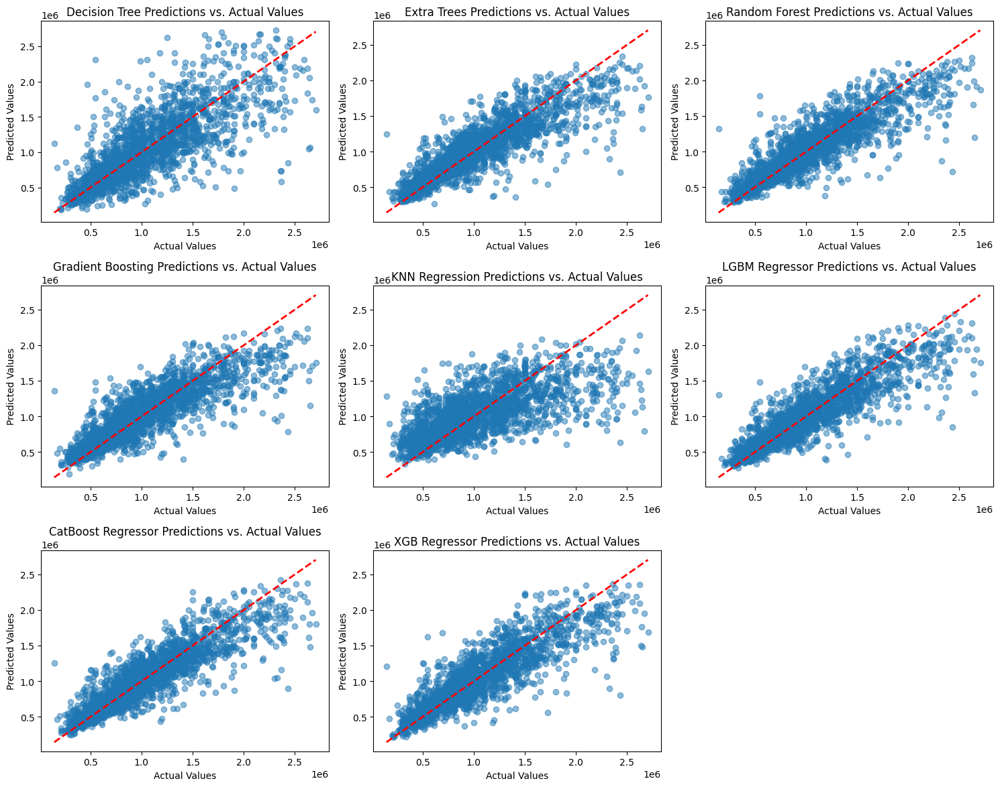

In [72]:
# Scater plot

# Define the grid layout
rows, cols = 3, 3

# Specify the figure size for the entire grid
plt.figure(figsize=(15, 12))

# Loop over models
for idx, (model_name, model) in enumerate(models.items(), 1):
    # Fit the model to training data
    model.fit(X_train_scaled, y_train)

    # Make predictions on the testing data
    y_pred = model.predict(X_test_scaled)

    # Scatter plot of Predictions vs. Actual Values for each model
    plt.subplot(rows, cols, idx)
    plt.scatter(y_test, y_pred, alpha=0.5)
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='red', linewidth=2)  # Diagonal line for perfect predictions
    plt.title(f'{model_name} Predictions vs. Actual Values')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')

# Adjust layout
plt.tight_layout()
plt.show()

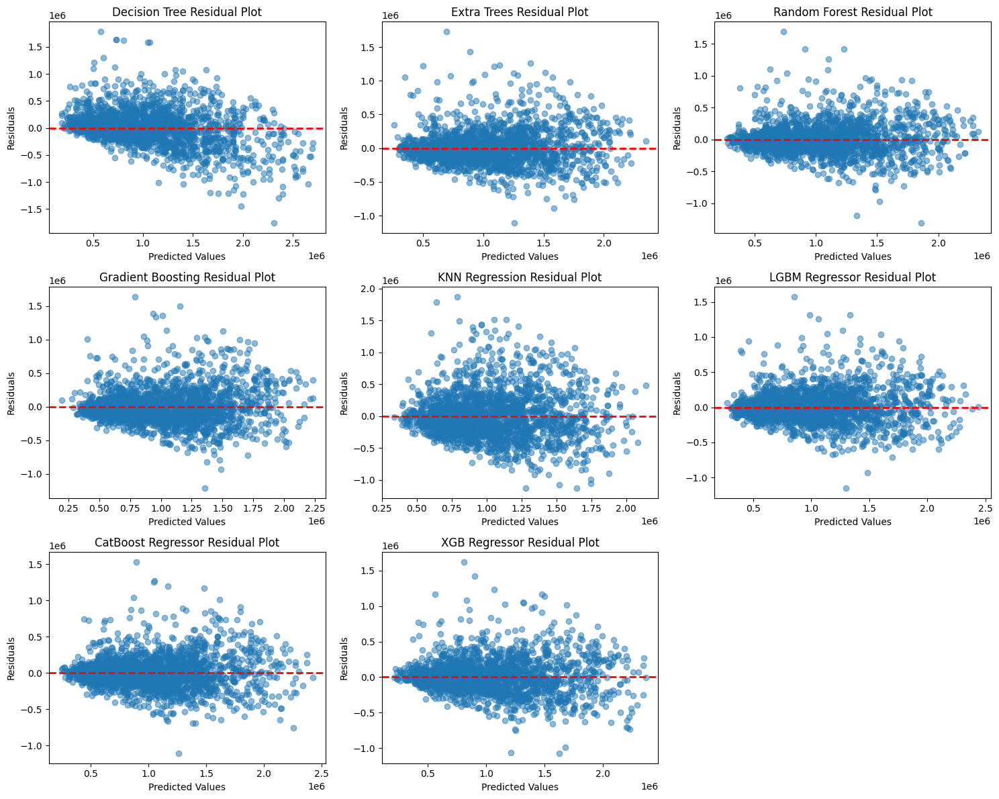

In [73]:
# Define the grid layout
rows, cols = 3, 3
plt.figure(figsize=(15, 12))

# Loop over models
for idx, (model_name, model) in enumerate(models.items(), 1):
    # Fit the model to training data
    model.fit(X_train_scaled, y_train)

    # Make predictions on the testing data
    y_pred = model.predict(X_test_scaled)

    # Calculate residuals
    residuals = y_test - y_pred

    # Residual plot for each model
    plt.subplot(rows, cols, idx)
    plt.scatter(y_pred, residuals, alpha=0.5)
    plt.axhline(y=0, color='red', linestyle='--', linewidth=2)
    plt.title(f'{model_name} Residual Plot')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')

# Adjust layout
plt.tight_layout()
plt.show()

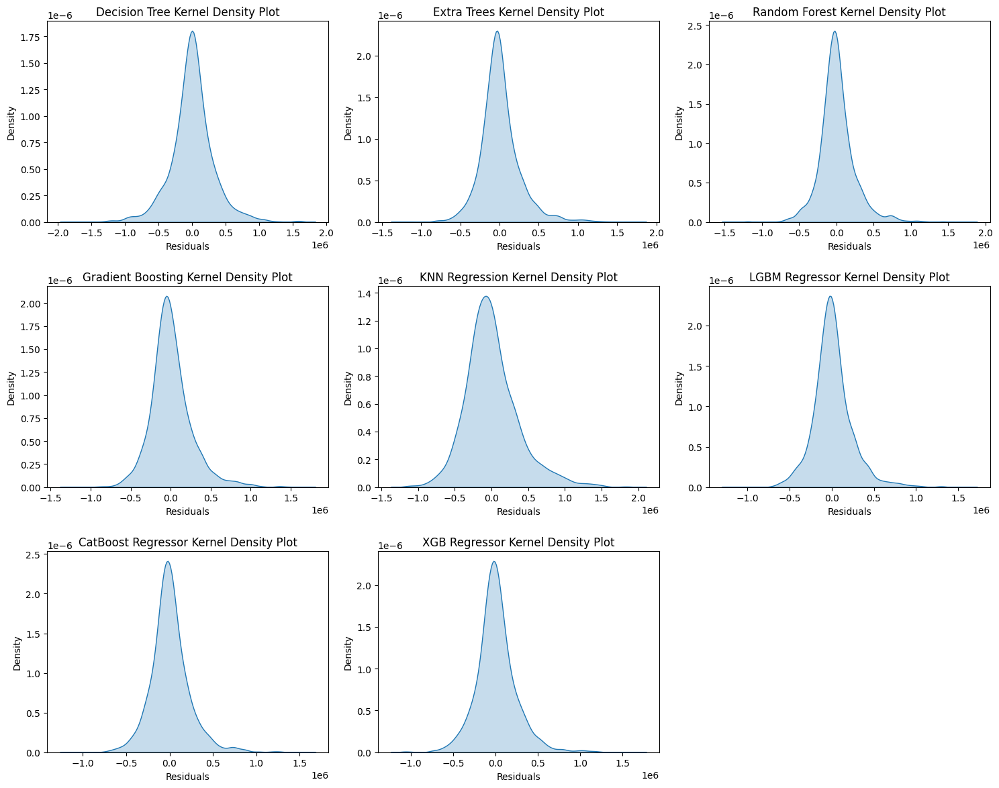

In [74]:
# Kernel Density Plot
# Define the grid layout
rows, cols = 3, 3
plt.figure(figsize=(15, 12))

# Loop over models
for idx, (model_name, model) in enumerate(models.items(), 1):
    # Fit the model to training data
    model.fit(X_train_scaled, y_train)

    # Make predictions on the testing data
    y_pred = model.predict(X_test_scaled)

    # Calculate residuals
    residuals = y_test - y_pred

    # Kernel density plot for residuals of each model
    plt.subplot(rows, cols, idx)
    sns.kdeplot(residuals, fill=True)
    plt.title(f'{model_name} Kernel Density Plot')
    plt.xlabel('Residuals')
    plt.ylabel('Density')

# Adjust layout
plt.tight_layout()
plt.show()

## Q-Q plot 

- The blue dots represent the quantiles of the residuals while the the red line represents the expected quantiles of a normal distribution.

- At the lower end (left tail), the points deviate below the red line, indicating negative skewness or heavy tails.
- At the upper end (right tail), the points deviate above the red line, suggesting positive skewness or outliers in the higher range.
- In the middle, the points follow the red line closely, indicating that the central portion of the residuals aligns reasonably well with a normal distribution.

1. Non-Normal Residuals:

- The plot reveals heavy tails on both ends. There is a lack of symmetry, indicating skewness and potential outliers in your residuals.
- The Residuals violating normality can affect the reliability of confidence intervals and hypothesis tests in linear regression. If the residuals are not normally distributed, this suggests your model may not fully capture the underlying patterns in the data.

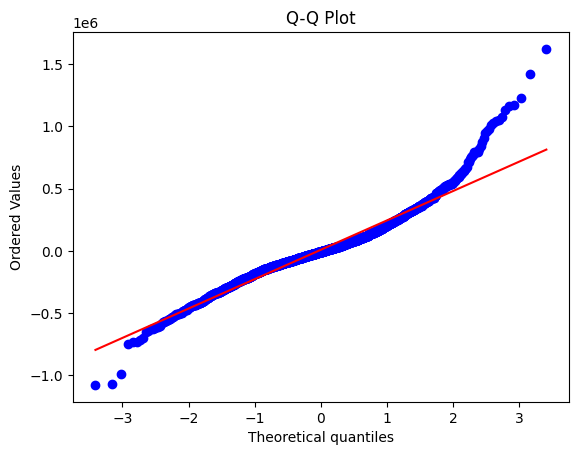

In [75]:
import scipy.stats as stats
import matplotlib.pyplot as plt

stats.probplot(residuals, dist="norm", plot=plt)
plt.title("Q-Q Plot")
plt.show()


## Actual vs predicted 

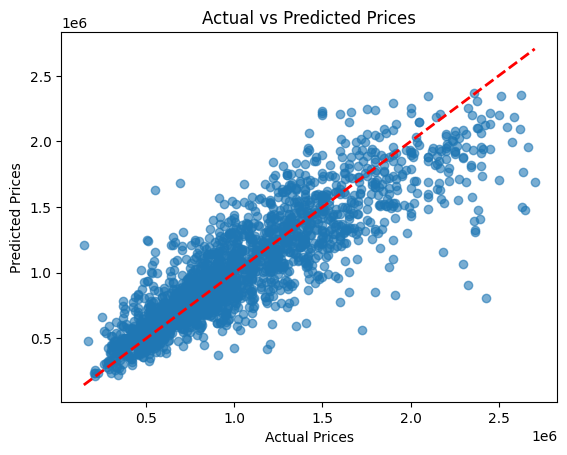

In [76]:
plt.scatter(y_test, y_pred, alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel("Actual Prices")
plt.ylabel("Predicted Prices")
plt.title("Actual vs Predicted Prices")
plt.show()

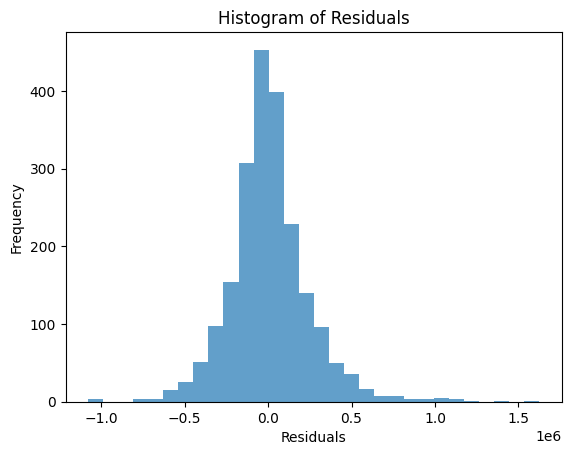

In [77]:
plt.hist(residuals, bins=30, alpha=0.7)
plt.title("Histogram of Residuals")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.show()


## Random Forest 

In [78]:
# Initialize the Random Forest Regressor
rf_model = RandomForestRegressor()

# Initialize a dictionary to store results
results = {
    'Model': [], 'MAE': [], 'MSE': [], 'RMSE': [], 'MAPE': [], 'R2': [],
    'Adjusted R2': [], 'COD': [], 'Training Time (s)': [], 'Prediction Time (s)': []
}

# Measure the training time
start_time = time.time()
rf_model.fit(X_train_scaled, y_train)
training_time = time.time() - start_time

# Measure the prediction time
start_time = time.time()
y_pred = rf_model.predict(X_test_scaled)
prediction_time = time.time() - start_time

# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100
r2 = r2_score(y_test, y_pred)

# Calculate Coefficient of Determination (COD) (it's equivalent to R2 in sklearn)
cod = r2  # COD is the same as R2 in sklearn metrics.

# Calculate Adjusted R2
n = X_test_scaled.shape[0]  # Number of samples
p = X_test_scaled.shape[1]  # Number of features
adjusted_r2 = 1 - ((1 - r2) * (n - 1) / (n - p - 1))

# Store results in a dictionary
results['Model'].append('Random Forest')
results['MAE'].append(mae)
results['MSE'].append(mse)
results['RMSE'].append(rmse)
results['R2'].append(r2)
results['Adjusted R2'].append(adjusted_r2)
results['COD'].append(cod)
results['MAPE'].append(mape)
results['Training Time (s)'].append(training_time)
results['Prediction Time (s)'].append(prediction_time)

# Create a DataFrame for results in dictionary
results_df = pd.DataFrame(results)

# Display the results
results_df


,Model,MAE,MSE,RMSE,MAPE,R2,Adjusted R2,COD,Training Time (s),Prediction Time (s)
0,Random Forest,164772.2013,5.759207e+10,239983.475276,17.424345,0.757729,0.751614,0.757729,12.02394,0.073199


## Scatter plot of actual vs predicted 

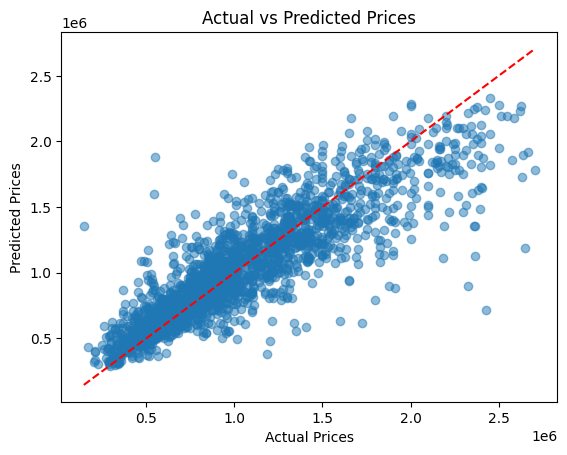

In [79]:
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=1.5)
plt.xlabel("Actual Prices")
plt.ylabel("Predicted Prices")
plt.title("Actual vs Predicted Prices")
plt.show()

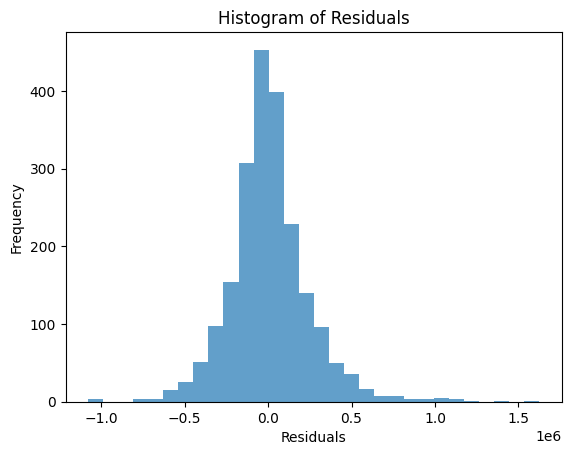

In [80]:
plt.hist(residuals, bins=30, alpha=0.7)
plt.title("Histogram of Residuals")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.show()


### Explanation of the Residual Plot:
- A residual plot visualizes the residuals (errors) of a regression model against the predicted values.
- `Residuals = Actual values - Predicted values.`

- Red Dashed Line: Represents the zero residual line where errors are zero. Blue Dots: Each dot represents the residual for a given predicted value.

1. Key Observations:

- Heteroscedasticity:
- The residuals show increasing spread (variance) as the predicted values increase, forming a funnel-like pattern.
- This suggests that the model may not handle the increasing variance in predictions well (i.e., variance is not constant).
2. Outliers:
- A few points have large positive and negative residuals (far from the red line), which indicates the presence of outliers.
3. Bias:
- Residuals are somewhat centered around the zero line but not perfectly random, meaning there might still be systematic patterns that the model hasn't captured.

4. Heteroscedasticity:

- It violates one of the key assumptions of linear regression and may lead to inefficient or biased predictions. In this case, predictions for higher target values are less accurate.
5. Outliers:
- Outliers can significantly impact the performance of the model. They need to be further analyzed and possibly addressed.

6. Model Fit:
- The presence of a funnel-like pattern indicates that a linear model may not be fully appropriate, or additional transformations may be required.


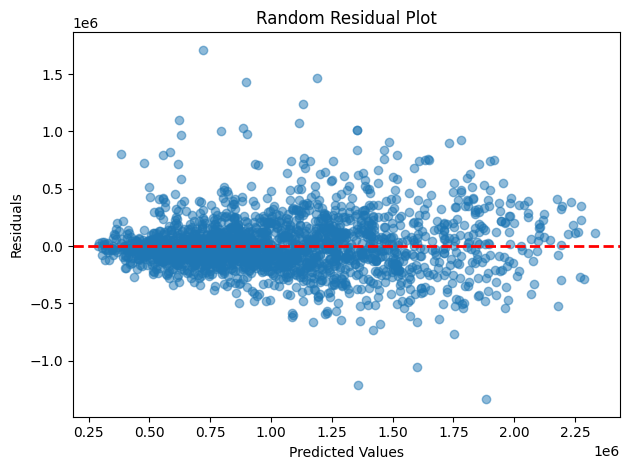

In [81]:
# Make predictions on the testing data
#y_pred = model.predict(X_test_scaled)

# Calculate residuals
residuals = y_test - y_pred

# Residual plot for each model
plt.scatter(y_pred, residuals, alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)
plt.title('Random Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

# Adjust layout
plt.tight_layout()
plt.show()

## KDE plot 

## Interpretation of the Kernel Density Plot of Residuals

1. What This Plot Shows:

- The x-axis represents the residuals (errors), which are the difference between actual values and predicted values.
- The y-axis represents the density (frequency of residual values).
- The smooth curve (kernel density estimation, KDE) helps visualize the distribution of residuals.

2. Key Observations:
- The residuals are centered around zero, which is a good sign.This indicates that the model's predictions are unbiased on average.
- The residuals form a roughly bell-shaped curve but with long tails on both sides.
- This suggests that most residuals are small, but there are a few larger errors (outliers).

3. Symmetry:
- The distribution appears symmetric, meaning the model overestimates and underestimates values relatively equally.

4. Implications:
- The model is performing reasonably well because residuals are centered around zero.
- However, the presence of long tails suggests that the model might have difficulty predicting certain extreme values or outliers.

5. Next Steps:
- Analyze Outliers:
- Investigate the data points contributing to the larger residuals to determine if they are true outliers or errors in the data.
6. Transformation:
- Consider applying log or Box-Cox transformations on the target variable to reduce the effect of outliers and stabilize the residuals.
7. Model Tuning:
- Fine-tune hyperparameters of the Random Forest model to improve performance on extreme values.
8. Alternate Models:
- Use robust models like Gradient Boosting, XGBoost, or models with built-in mechanisms to handle outliers effectively.

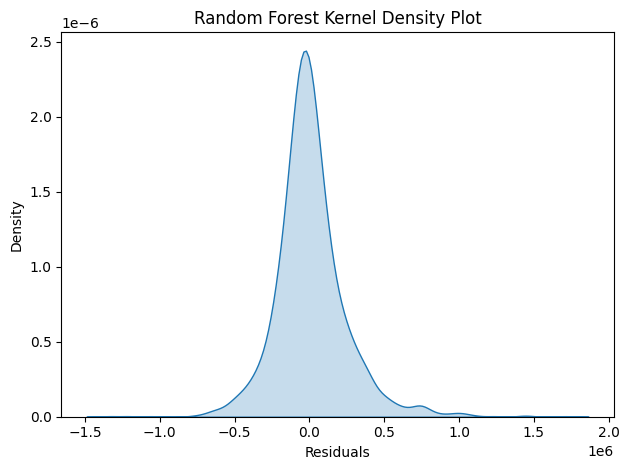

In [82]:
## KDE plot 
# Kernel density plot for residuals of each model
sns.kdeplot(residuals, fill=True)
plt.title('Random Forest Kernel Density Plot')
plt.xlabel('Residuals')
plt.ylabel('Density')

# Adjust layout
plt.tight_layout()
plt.show()

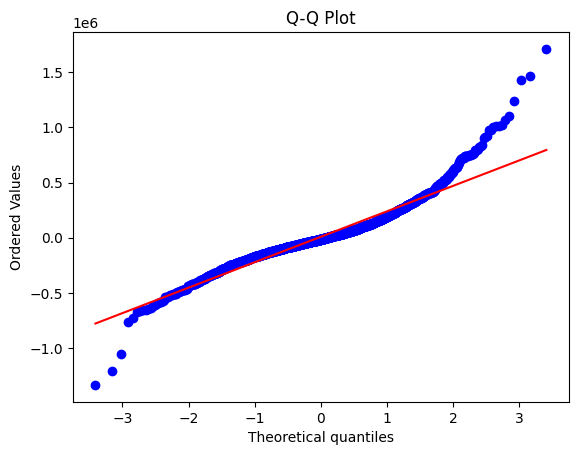

In [83]:
import scipy.stats as stats
import matplotlib.pyplot as plt

stats.probplot(residuals, dist="norm", plot=plt)
plt.title("Q-Q Plot")
plt.show()


In [84]:
## Feature importance 

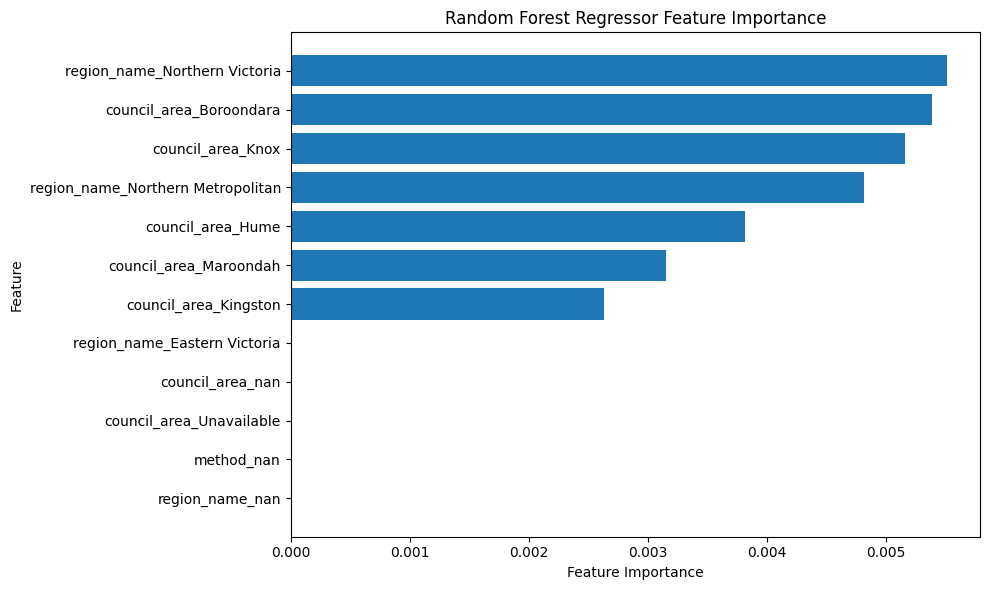

In [85]:
# Get Feature Importance
feature_importance =  model.feature_importances_

# Create a DataFrame to view feature importance 
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)[40:60]

# Plot Horizontal Bar Graph
plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Random Forest Regressor Feature Importance')
plt.gca().invert_yaxis()  # Invert the y-axis to have most important at the top
plt.tight_layout()  # Adjust layout for better visualization
plt.show()

### The Residuals vs. Predicted Values 
- Is a diagnostic plot used to assess the assumption of homoscedasticity (constant variance) of residuals. Homoscedasticity is important where the assumption is that the variance of the errors (residuals) is constant across all levels of the independent variables.
1. Homoscedasticity (Ideal Case)
- The residuals should be randomly spread around zero without any clear patterns. This indicates that the variance of errors is constant across all predicted values. A good model should have residuals scattered evenly without a funnel-shaped pattern or any systematic trend.

2. Heteroscedasticity (Problematic Case)
- If the residuals form a pattern, such as a "funnel" shape (widening or narrowing as predicted values increase or decrease), it suggests that the variance of the residuals is not constant. This violates the assumption of homoscedasticity and can indicate model misspecification, outliers, or that the model is not capturing some underlying structure in the data.



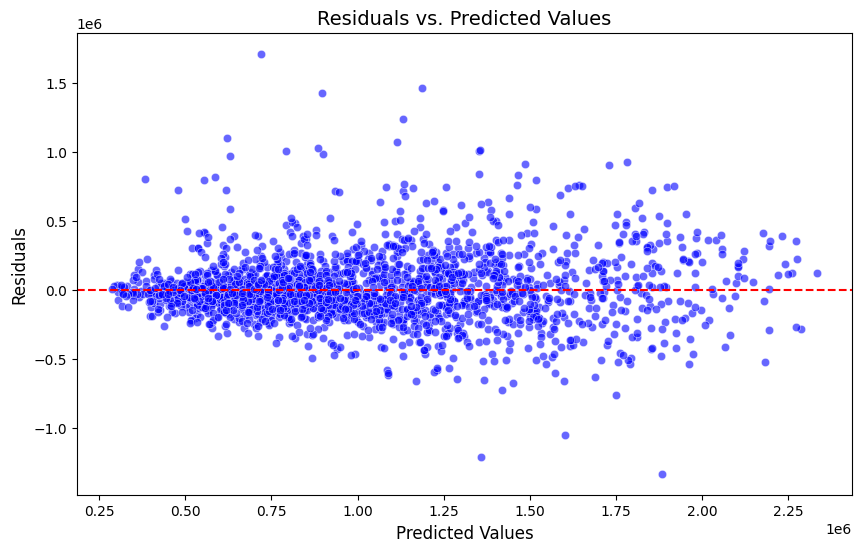

In [86]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Calculate residuals
residuals = y_test - y_pred

# Create a scatter plot of residuals vs. predicted values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_pred, y=residuals, color='blue', alpha=0.6)

# Add horizontal line at 0 (indicating perfect predictions)
plt.axhline(y=0, color='red', linestyle='--')

# Set labels and title
plt.title('Residuals vs. Predicted Values', fontsize=14)
plt.xlabel('Predicted Values', fontsize=12)
plt.ylabel('Residuals', fontsize=12)

# Show plot
plt.show()


[12:38:51] WARNING: /croot/xgboost-split_1721080008937/work/src/learner.cc:576: 
Parameters: { "early_stopping_rounds" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




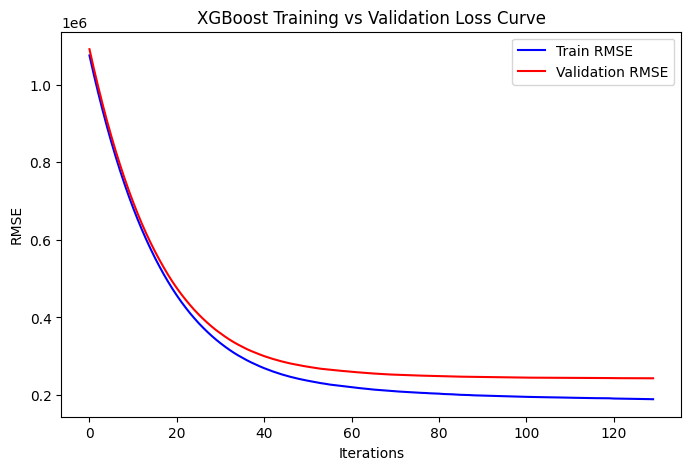

In [87]:
import matplotlib.pyplot as plt
import xgboost as xgb

# Define the model
xgb_model = xgb.XGBRegressor(n_estimators=130, learning_rate=0.05, eval_metric="rmse", early_stopping_rounds=10)

# Fit the model with training and validation sets
eval_set = [(X_train_scaled, y_train), (X_test_scaled, y_test)]
xgb_model.fit(X_train_scaled, y_train, eval_set=eval_set, verbose=False)

# Retrieve evaluation results
results = xgb_model.evals_result()

# Plot Training vs Validation Loss (RMSE)
plt.figure(figsize=(8, 5))
plt.plot(results['validation_0']['rmse'], label='Train RMSE', color='blue')
plt.plot(results['validation_1']['rmse'], label='Validation RMSE', color='red')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('XGBoost Training vs Validation Loss Curve')
plt.legend()
plt.show()

[12:38:53] WARNING: /croot/xgboost-split_1721080008937/work/src/learner.cc:576: 
Parameters: { "early_stopping_rounds" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




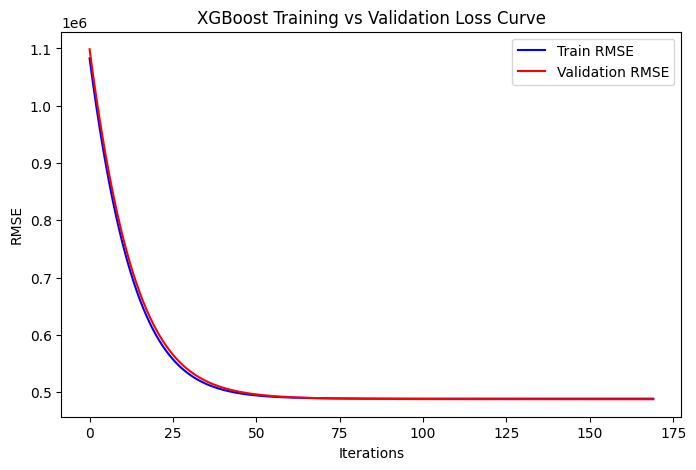

In [88]:
import matplotlib.pyplot as plt
import xgboost as xgb

# Define the model
xgb_model = xgb.XGBRegressor(n_estimators=170, learning_rate=0.05, eval_metric="rmse", early_stopping_rounds=10,
                             max_depth=0)

# Fit the model with training and validation sets
eval_set = [(X_train_scaled, y_train), (X_test_scaled, y_test)]
xgb_model.fit(X_train_scaled, y_train, eval_set=eval_set, verbose=False)

# Retrieve evaluation results
results = xgb_model.evals_result()

# Plot Training vs Validation Loss (RMSE)
plt.figure(figsize=(8, 5))
plt.plot(results['validation_0']['rmse'], label='Train RMSE', color='blue')
plt.plot(results['validation_1']['rmse'], label='Validation RMSE', color='red')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('XGBoost Training vs Validation Loss Curve')
plt.legend()
plt.show()

In [89]:
xgb_model 

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, early_stopping_rounds=10,
             enable_categorical=False, eval_metric='rmse', gamma=0, gpu_id=-1,
             importance_type=None, interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=0,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=170, n_jobs=8, num_parallel_tree=1, predictor='auto',
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             subsample=1, tree_method='exact', validate_parameters=1,
             verbosity=None)

In [90]:
# Initialize the Random Forest Regressor
#rf_model = RandomForestRegressor()

# Initialize a dictionary to store results
results = {
    'Model': [], 'MAE': [], 'MSE': [], 'RMSE': [], 'MAPE': [], 'R2': [],
    'Adjusted R2': [], 'COD': [], 'Training Time (s)': [], 'Prediction Time (s)': []
}

# Measure the training time
start_time = time.time()
xgb_model.fit(X_train_scaled, y_train)
training_time = time.time() - start_time

# Measure the prediction time
start_time = time.time()
y_pred = xgb_model.predict(X_test_scaled)
prediction_time = time.time() - start_time

# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100
r2 = r2_score(y_test, y_pred)

# Calculate Coefficient of Determination (COD) (it's equivalent to R2 in sklearn)
cod = r2  # COD is the same as R2 in sklearn metrics.

# Calculate Adjusted R2
n = X_test_scaled.shape[0]  # Number of samples
p = X_test_scaled.shape[1]  # Number of features
adjusted_r2 = 1 - ((1 - r2) * (n - 1) / (n - p - 1))

# Store results in a dictionary
results['Model'].append('Random Forest')
results['MAE'].append(mae)
results['MSE'].append(mse)
results['RMSE'].append(rmse)
results['R2'].append(r2)
results['Adjusted R2'].append(adjusted_r2)
results['COD'].append(cod)
results['MAPE'].append(mape)
results['Training Time (s)'].append(training_time)
results['Prediction Time (s)'].append(prediction_time)

# Create a DataFrame for results in dictionary
results_df = pd.DataFrame(results)

# Display the results
results_df


[12:38:53] WARNING: /croot/xgboost-split_1721080008937/work/src/learner.cc:576: 
Parameters: { "early_stopping_rounds" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




,Model,MAE,MSE,RMSE,MAPE,R2,Adjusted R2,COD,Training Time (s),Prediction Time (s)
0,Random Forest,386621.597758,2.380658e+11,487919.83856,47.362257,-0.001464,-0.026744,-0.001464,0.329618,0.00278
